# BibNet Evaluation

This notebook evaluates the bib number detection model. It loads a trained model, runs evaluation on a test dataset, and visualizes the results.

## Import Dependencies

First, let's import all the required libraries and modules.

In [18]:
import os
import argparse
import yaml
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import albumentations as A
import wandb

from model import BibNet
from loss import Evaluator
from dataloader import create_dataloaders
from wandb_utils import load_model_artifact

## Define Evaluation Functions

Define the core functions needed for model evaluation and visualizing predictions.

In [19]:
def evaluate_model(model, dataloader, device, evaluator):
    """
    Evaluate model on a dataset.

    Args:
        model (nn.Module): The model to evaluate
        dataloader (DataLoader): Data loader
        device (torch.device): Device to use
        evaluator (Evaluator): COCO evaluator

    Returns:
        tuple: (metrics, predictions, targets_list)
    """
    model.eval()
    predictions = []
    targets_list = []

    with torch.no_grad():
        for images, targets in dataloader:
            # Move to device
            images = images.to(device)

            # Each target in targets is a dict with "boxes" in YOLO format (normalized)
            targets_list.extend(targets)

            # Get predictions
            # Each pred in preds is a dict with "boxes" in YOLO format (normalized)
            # and "scores" for confidence values
            preds = model.predict(images)
            predictions.extend(preds)

    # Put predictions and targets to device
    targets_list = [{k: v.to(device) for k, v in t.items()} for t in targets_list]
    predictions = [{k: v.to(device) for k, v in p.items()} for p in predictions]

    # Calculate metrics
    metrics = evaluator.evaluate(predictions, targets_list)

    return metrics, predictions, targets_list

In [20]:
def visualize_predictions(images, predictions, targets, output_dir, num_samples=5, conf_threshold=0.5):
    """
    Visualize model predictions with images in their original aspect ratio.

    Args:
        images (list): List of images (in square format from the model)
        predictions (list): List of prediction dictionaries, with boxes in YOLO format (normalized)
        targets (list): List of target dictionaries, with boxes in YOLO format (normalized)
        output_dir (str): Directory to save visualizations
        num_samples (int): Number of samples to visualize
        conf_threshold (float): Confidence threshold for predictions
    """
    os.makedirs(output_dir, exist_ok=True)

    # Get sample indices
    indices = np.random.choice(len(images), min(num_samples, len(images)), replace=False)

    for i, idx in enumerate(indices):
        # Get image (image is initially PyTorch [C, H, W] format)
        image = images[idx].permute(1, 2, 0).cpu().numpy()

        # Get original image dimensions
        orig_height, orig_width = targets[idx]["orig_size"].cpu().numpy()
        img_size = image.shape[0]  # Assuming square image (height = width)

        # Calculate scaling factors
        scale_x = orig_width / img_size
        scale_y = orig_height / img_size

        # Denormalize image pixels with (train) dataset mean and std
        mean = np.array([130.49231, 127.54519, 120.42242]) / 255.0
        std = np.array([68.2691, 66.321335, 69.71906]) / 255.0
        image = std * image + mean
        image = np.clip(image, 0, 1)

        # Convert to 0-255 range for Albumentations (expects this range)
        image_255 = (image * 255).astype(np.uint8)

        # Resize imag back to original aspect ratio
        transform = A.Compose([
            A.Resize(height=int(orig_height), width=int(orig_width))
        ])
        image_resized = transform(image=image_255)["image"]

        # Convert back to [0,1] range for matplotlib
        image_resized = image_resized.astype(float) / 255.0

        # Create figure
        fig, ax = plt.subplots(1, figsize=(10, 10 * orig_height / orig_width))
        ax.imshow(image_resized)

        # Function to transform normalized YOLO boxes to original image coordinates
        def transform_boxes(boxes):
            # Convert from normalized YOLO [xcenter, ycenter, width, height] to absolute pixels
            boxes_abs = boxes.copy()

            # Scale to square image coordinates (denormalize)
            boxes_abs[:, 0] *= img_size  # x_center
            boxes_abs[:, 1] *= img_size  # y_center
            boxes_abs[:, 2] *= img_size  # width
            boxes_abs[:, 3] *= img_size  # height

            # Convert center format to corner format
            x_min = boxes_abs[:, 0] - boxes_abs[:, 2] / 2
            y_min = boxes_abs[:, 1] - boxes_abs[:, 3] / 2
            x_max = boxes_abs[:, 0] + boxes_abs[:, 2] / 2
            y_max = boxes_abs[:, 1] + boxes_abs[:, 3] / 2

            # Scale to original image dimensions
            x_min *= scale_x
            y_min *= scale_y
            x_max *= scale_x
            y_max *= scale_y

            # Return in [x_min, y_min, x_max, y_max] format
            return np.column_stack((x_min, y_min, x_max, y_max))

        # Plot ground truth boxes
        if len(targets[idx]["boxes"]) > 0:
            print(f'Number of ground truth boxes = {len(targets[idx]["boxes"])}')
            boxes_orig = transform_boxes(targets[idx]["boxes"].cpu().numpy())
            for box in boxes_orig:
                x1, y1, x2, y2 = box
                width = x2 - x1
                height = y2 - y1
                rect = patches.Rectangle(
                    (x1, y1),
                    width,
                    height,
                    linewidth=2,
                    edgecolor="g",
                    facecolor="none",
                    label="Ground Truth",
                )
                ax.add_patch(rect)

        # Plot predicted boxes
        pred = predictions[idx]
        if len(pred["boxes"]) > 0:
            print(f'Number of predicted boxes = {len(pred["boxes"])}')
            boxes_orig = transform_boxes(pred["boxes"].cpu().numpy())
            for box, score in zip(boxes_orig, pred["scores"].cpu().numpy()):
                if score >= conf_threshold:
                    x1, y1, x2, y2 = box
                    width = x2 - x1
                    height = y2 - y1
                    rect = patches.Rectangle(
                        (x1, y1),
                        width,
                        height,
                        linewidth=2,
                        edgecolor="r",
                        facecolor="none",
                        label=f"Prediction ({score:.2f})",
                    )
                    ax.add_patch(rect)
                    ax.text(
                        x1,
                        y1,
                        f"{score:.2f}",
                        bbox=dict(facecolor="r", alpha=0.5),
                        fontsize=8,
                        color="white",
                    )

        # Add legend and save figure
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax.legend(by_label.values(), by_label.keys(), loc="upper right")

        plt.title(f"Sample {i + 1}")
        plt.axis("off")
        plt.savefig(os.path.join(output_dir, f"sample_{i + 1}.png"), bbox_inches="tight")
        plt.show()
        plt.close()

## Load Configuration

Now let's load the evaluation configuration from the YAML file.

In [21]:
# Load config
config_path = "eval_config.yaml"
with open(config_path, "r") as f:
    config = yaml.safe_load(f)

# Display the configuration
print("Evaluation configuration:")
for key, value in config.items():
    print(f"  {key}: {value}")

Evaluation configuration:
  data_dir: data
  img_size: 416
  backbone_features: [64, 128, 256, 512, 1024]
  grid_sizes: [13, 26, 52]
  batch_size: 8
  num_workers: 4
  seed: 42
  conf_threshold: 0.51
  num_viz_samples: 10
  viz_output_dir: visualizations
  model_path: checkpoints/best_model.pth
  wandb_artifact: mdengis-team/bibnet/best-model:v56


## Setup Environment

Set up the device, random seeds, and other components needed for evaluation.

In [22]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Set random seed
torch.manual_seed(config["seed"])
np.random.seed(config["seed"])

Using device: cuda


## Create Data Loaders

Create the data loaders for the evaluation dataset.

In [23]:
# Create data loaders
_, _, test_loader = create_dataloaders(
    data_dir=config["data_dir"],
    img_size=config["img_size"],
    batch_size=config["batch_size"],
    num_workers=config["num_workers"],
)

print(f"Test dataset loaded with {len(test_loader)} batches")

Computing dataset statistics...
Dataset mean: [130.49231 127.54519 120.42242]
Dataset std: [68.2691   66.321335 69.71906 ]
Test dataset loaded with 118 batches


## Load Model

Create and load the BibNet model with the trained weights.

In [24]:
# Create model
model = BibNet(
    img_size=config["img_size"],
    backbone_features=config["backbone_features"],
).to(device)

# Load model weights - either from local file or W&B artifact
if "wandb_artifact" in config and config["wandb_artifact"]:
    print(f"Loading model from W&B artifact: {config['wandb_artifact']}")
    model = load_model_artifact(config["wandb_artifact"], model, device)
else:
    model_path = config["model_path"]
    print(f"Loading model from local file: {model_path}")
    model.load_state_dict(torch.load(model_path, map_location=device))

print("Model loaded successfully.")

Loading model from W&B artifact: mdengis-team/bibnet/best-model:v56


wandb: Downloading large artifact best-model:v56, 106.32MB. 1 files... 
wandb:   1 of 1 files downloaded.  
Done. 0:0:0.9 (116.7MB/s)


Model loaded successfully.


## Evaluate Model

Run the model evaluation and calculate the performance metrics.

In [25]:
# Create evaluator
evaluator = Evaluator()

# Evaluate model
print("Evaluating model...")
metrics, predictions, targets = evaluate_model(model, test_loader, device, evaluator)

# Put on CPU for visualization
targets = [{k: v.to("cpu") for k, v in t.items()} for t in targets]
predictions = [{k: v.to("cpu") for k, v in p.items()} for p in predictions]

# Print metrics
print("\nEvaluation metrics:")
for k, v in metrics.items():
    print(f"  {k}: {v:.4f}")

Evaluating model...

Evaluation metrics:
  AP_0.50: 0.0002
  AP_0.75: 0.0000
  AP_0.95: 0.0000
  mAP: 0.0001


## Visualize Predictions

Visualize the model's predictions on the test dataset.

Collected 10 images for visualization
Visualizing predictions...
Number of ground truth boxes = 3
Number of predicted boxes = 378


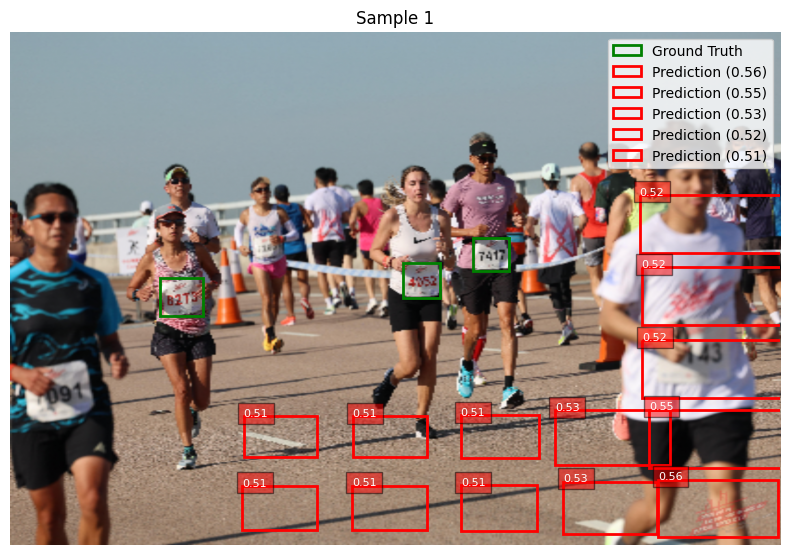

Number of ground truth boxes = 1
Number of predicted boxes = 405


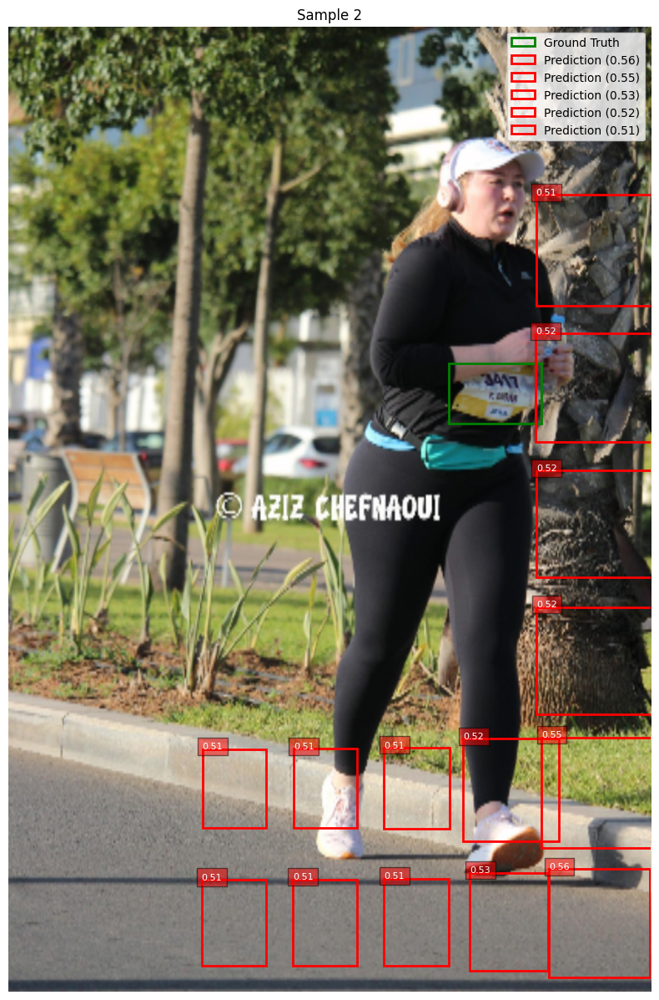

Number of ground truth boxes = 1
Number of predicted boxes = 527


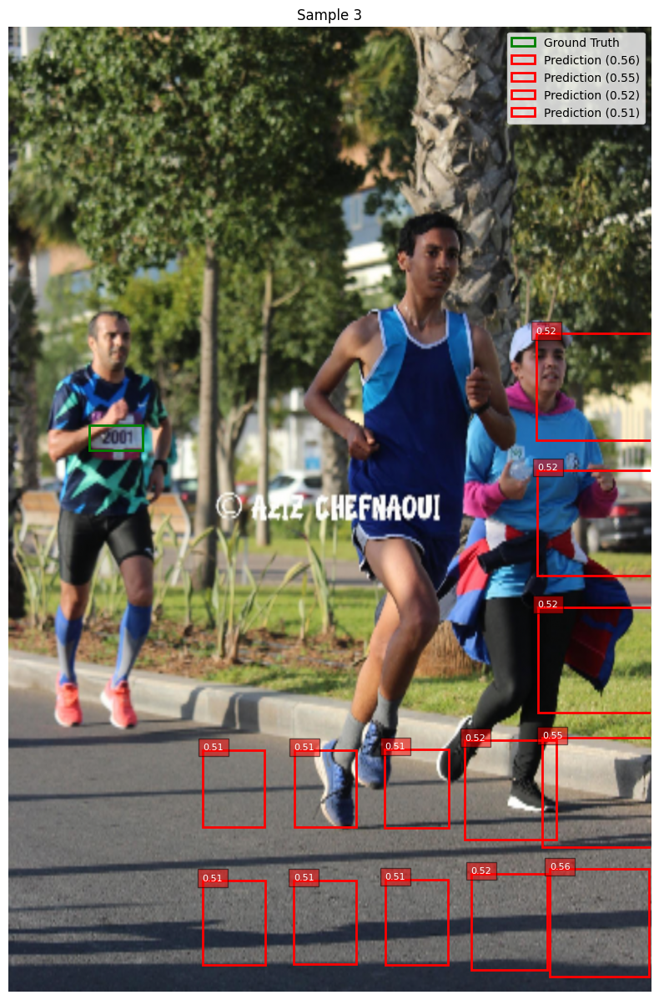

Number of ground truth boxes = 3
Number of predicted boxes = 396


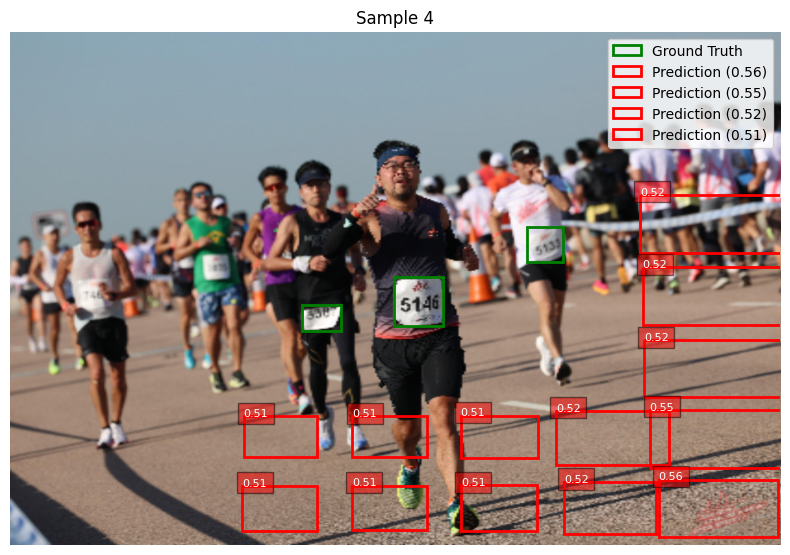

Number of ground truth boxes = 2
Number of predicted boxes = 458


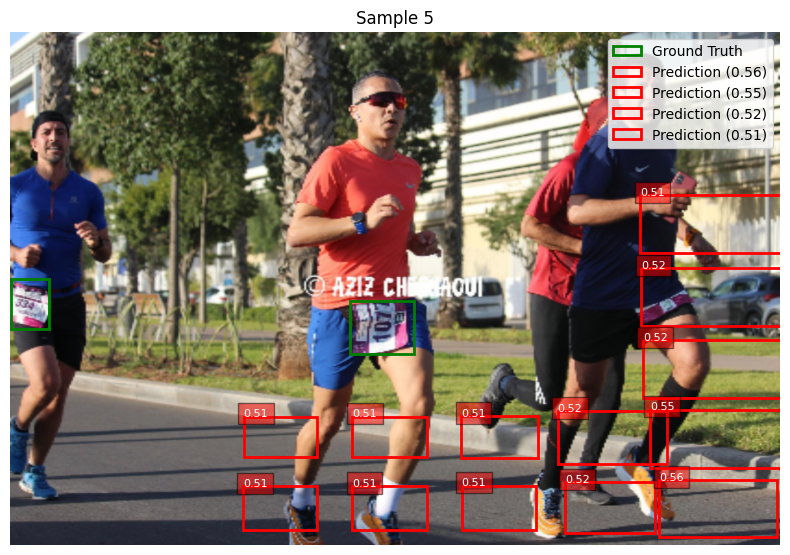

Number of ground truth boxes = 1
Number of predicted boxes = 358


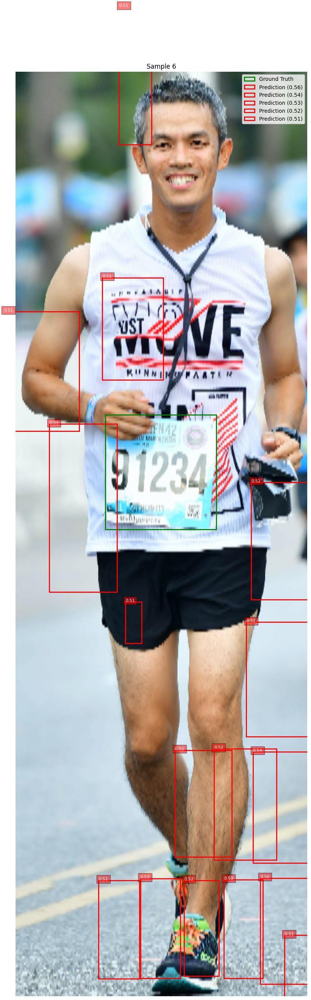

Number of ground truth boxes = 1
Number of predicted boxes = 367


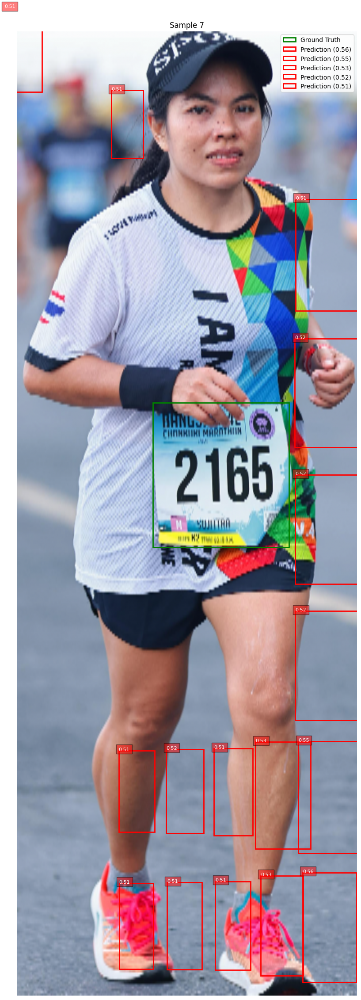

Number of ground truth boxes = 1
Number of predicted boxes = 416


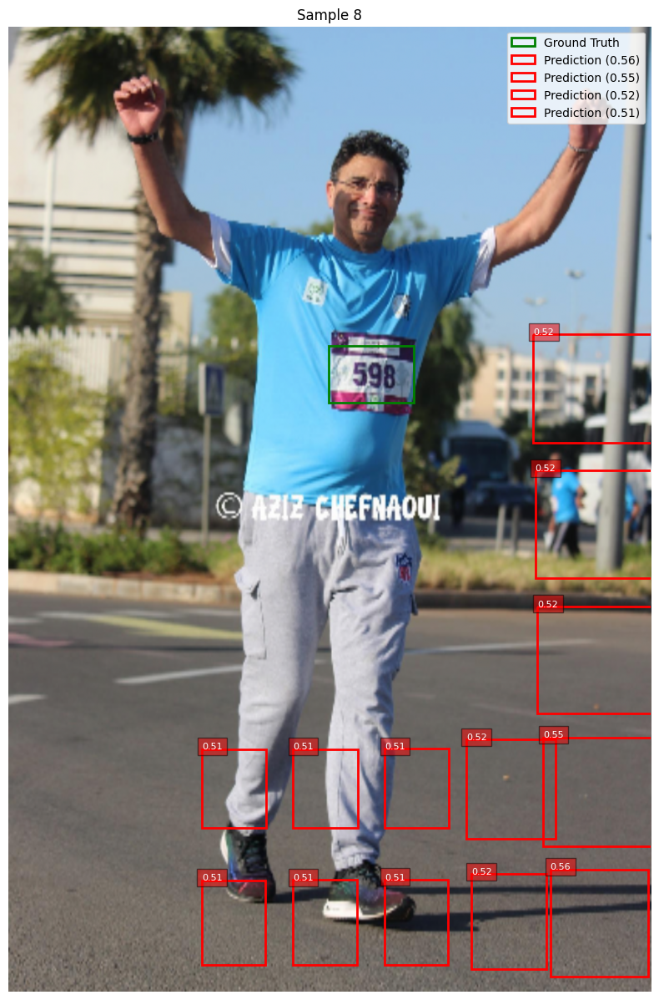

Number of ground truth boxes = 1
Number of predicted boxes = 382


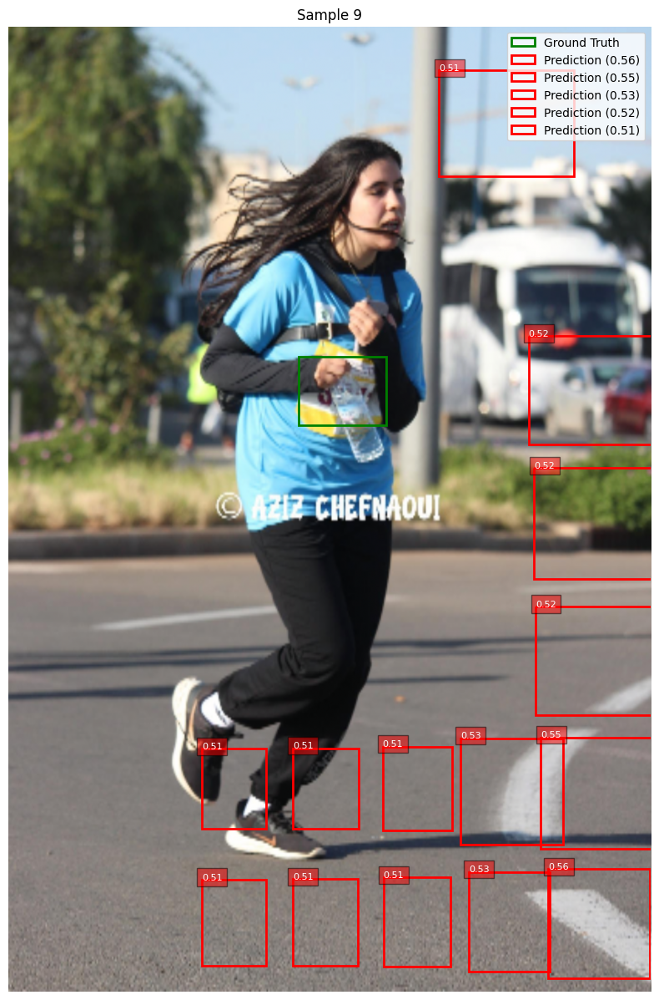

Number of ground truth boxes = 2
Number of predicted boxes = 389


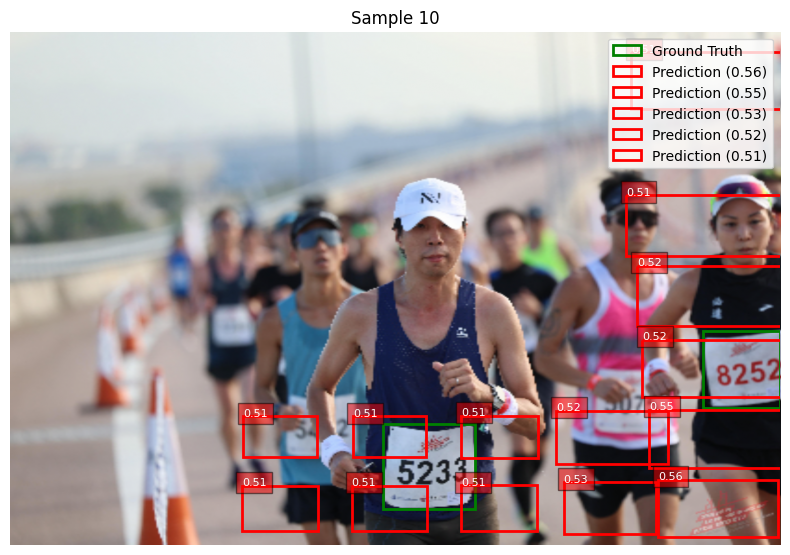

Saved visualizations to visualizations


In [26]:
# Collect images for visualization
print("Collecting images for visualization...")
images = []

for batch_images, _ in test_loader:
    images.extend([img for img in batch_images])

    # to limit the nb of images to visualize
    if len(images) >= config["num_viz_samples"]:
        break

print(f"Collected {len(images[:config['num_viz_samples']])} images for visualization")

# Visualize predictions
print("Visualizing predictions...")
visualize_predictions(
    images[:config["num_viz_samples"]],
    predictions[:config["num_viz_samples"]],
    targets[:config["num_viz_samples"]],
    config["viz_output_dir"],
    config["num_viz_samples"],
    config["conf_threshold"],
)

print(f"Saved visualizations to {config['viz_output_dir']}")